# Image Histograms

In [9]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [52]:
def load_img(src):
    img_process = cv.imread(src) #BGR
    img_show = cv.cvtColor(img_process, cv.COLOR_BGR2RGB) #RGB
    return img_process, img_show

In [53]:
HORSE_IMAGE_PATH = "../assets/horse.jpg"
horse_process, horse_show = load_img(HORSE_IMAGE_PATH)

RAINBOW_IMAGE_PATH = "../assets/rainbow.jpg"
rainbow_process, rainbow_show = load_img(RAINBOW_IMAGE_PATH)

BRICKS_IMAGE_PATH = "../assets/bricks.jpg"
bricks_process, bricks_show = load_img(BRICKS_IMAGE_PATH)


## Original Images

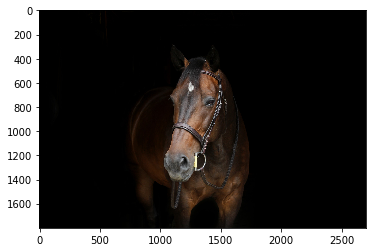

In [54]:
plt.imshow(horse_show)

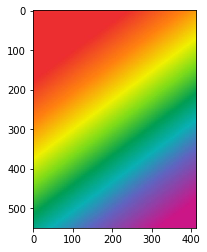

In [55]:
plt.imshow(rainbow_show)

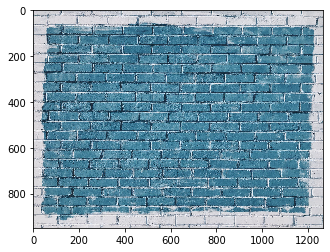

In [56]:
plt.imshow(bricks_show)

## Histogram

### Plotting single channel

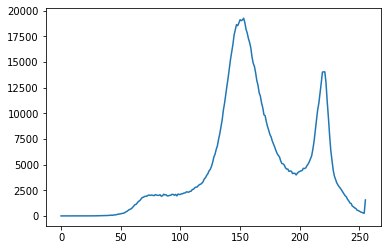

In [57]:
# OPENCV BRG
histogram_values = cv.calcHist([bricks_process], channels=[0], mask=None, histSize=[256], ranges=[0,256])
plt.plot(histogram_values)

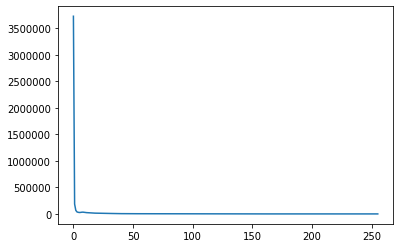

In [58]:
# OPENCV BRG
histogram_values = cv.calcHist([horse_process], channels=[0], mask=None, histSize=[256], ranges=[0,256])
plt.plot(histogram_values)

### Plotting multiple channel

In [59]:
def plot_histogram_all_channels(img, xlim=[0,256]):
    
    channels = ('b','g','r')
    
    for i, channel in enumerate(channels):
        values = cv.calcHist([img], [i], None, [256], [0,256])
        plt.plot(values, color=channel)
        plt.xlim(xlim)
    
    plt.title('HISTOGRAM')

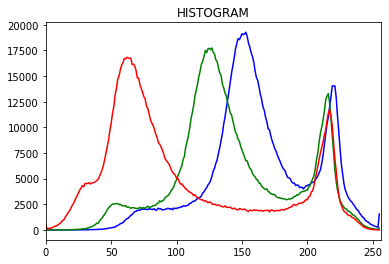

In [60]:
plot_histogram_all_channels(bricks_process)

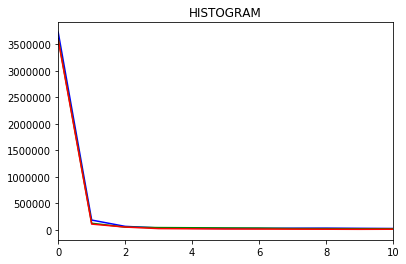

In [61]:
plot_histogram_all_channels(horse_process, [0,10])

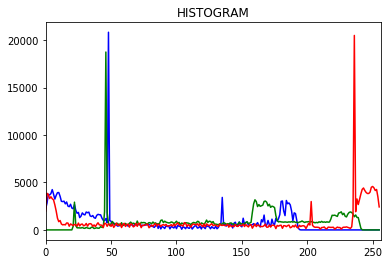

In [62]:
plot_histogram_all_channels(rainbow_process)

## Histogram With Mask

In [63]:
mask = np.zeros(rainbow_process.shape[:2], np.uint8)
mask.shape, rainbow_process.shape

((550, 413), (550, 413, 3))

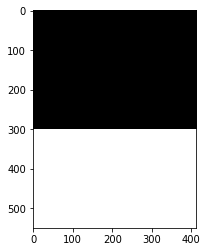

In [64]:
# just for display purpose
# A half will have contrast the other half will be the original image
mask[300:] = 255
plt.imshow(mask, cmap="gray")

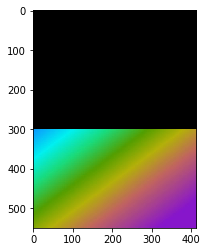

In [65]:
masked_process = cv.bitwise_and(rainbow_process, rainbow_process, mask=mask)

masked_show = cv.bitwise_and(rainbow_show, rainbow_show, mask=mask)

plt.imshow(masked_img)

In [66]:
histogram_red_mask_value = cv.calcHist([rainbow_process], channels=[2], mask=mask, histSize=[256], ranges=[0,256])
histogram_red_value = cv.calcHist([rainbow_process], channels=[2], mask=None, histSize=[256], ranges=[0,256])

Text(0.5, 1.0, 'HISTOGRAM: RED W/ MASK')

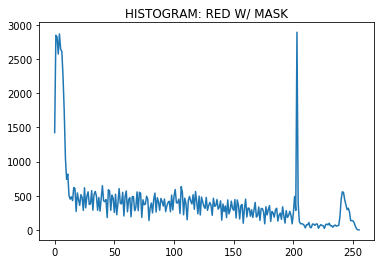

In [67]:
plt.plot(histogram_red_mask_value)
plt.title("HISTOGRAM: RED W/ MASK")

Text(0.5, 1.0, 'HISTOGRAM: RED')

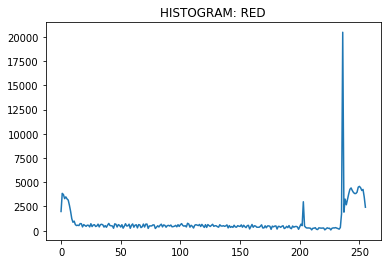

In [68]:
plt.plot(histogram_red_value)
plt.title("HISTOGRAM: RED")

## Equalization

### Equalize Grayscale

In [71]:
def show_img(img, cmap="jet"):
    fig = plt.figure(figsize=(15,15))
    subplot = fig.add_subplot(111)
    subplot.imshow(img, cmap=cmap)

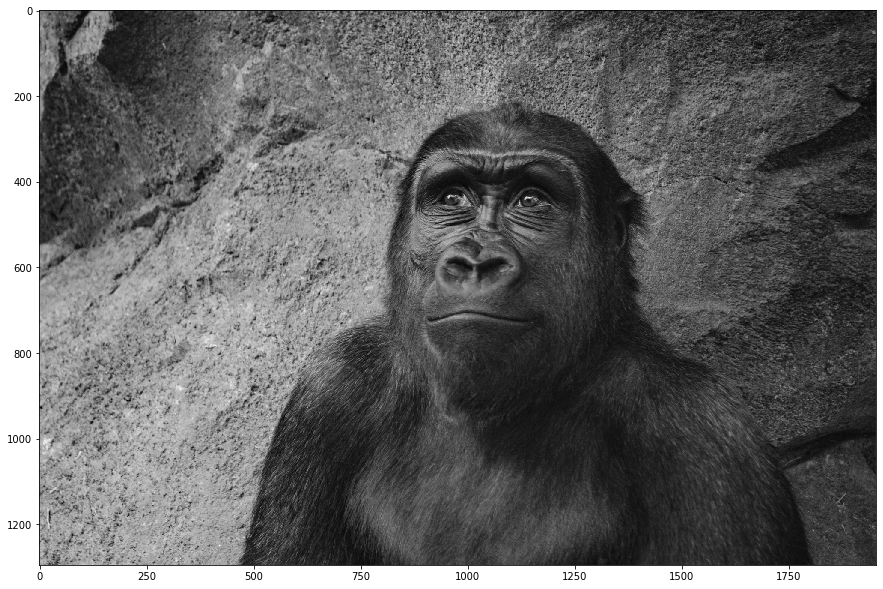

In [74]:
gorilla = cv.imread('../assets/gorilla.jpg', 0)
show_img(gorilla, 'gray')

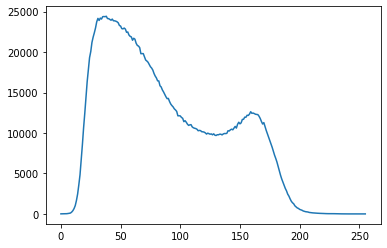

In [78]:
histogram_values = cv.calcHist([gorilla], channels=[0], mask=None, histSize=[256], ranges=[0,256])
plt.plot(histogram_values)

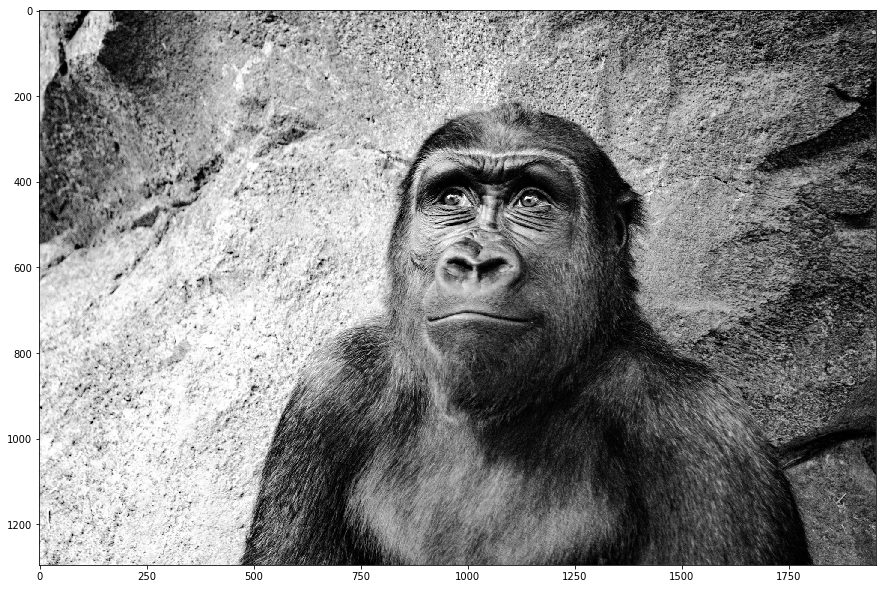

In [79]:
gorilla_eq = cv.equalizeHist(gorilla)
show_img(gorilla_eq, "gray")

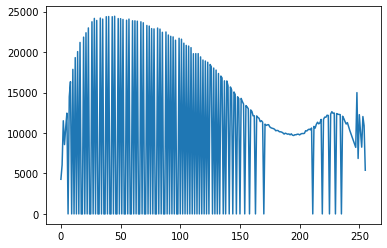

In [80]:
histogram_values = cv.calcHist([gorilla_eq], channels=[0], mask=None, histSize=[256], ranges=[0,256])
plt.plot(histogram_values)

### Equalize BGR

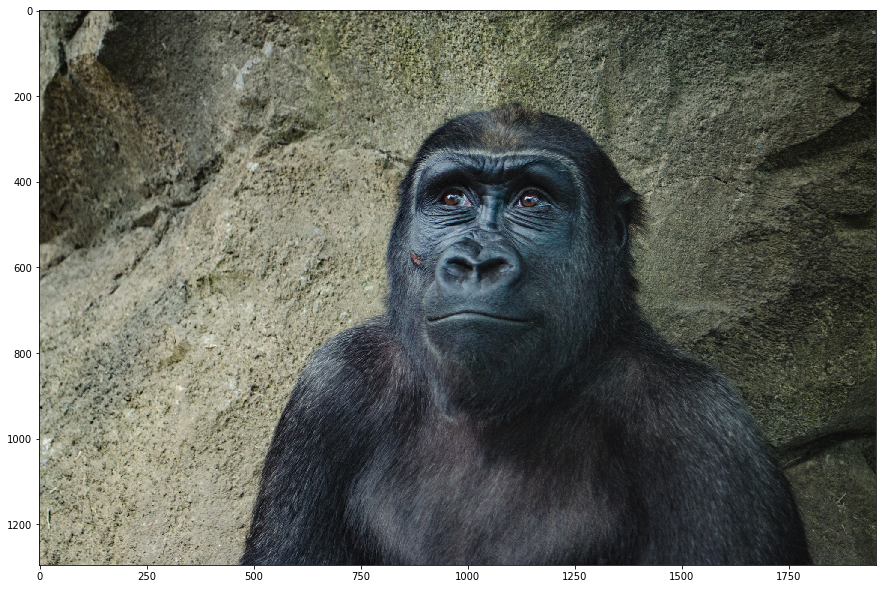

In [82]:
gorilla_process, gorilla_show = load_img('../assets/gorilla.jpg')
show_img(gorilla_show, 'gray')

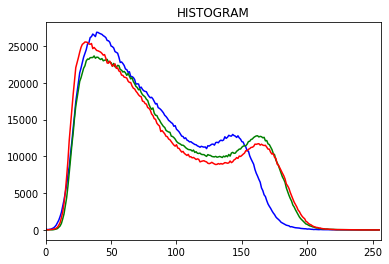

In [83]:
plot_histogram_all_channels(gorilla_process)

In [84]:
hsv = cv.cvtColor(gorilla_process, cv.COLOR_BGR2HSV)
hsv[:,:,2].min()

0

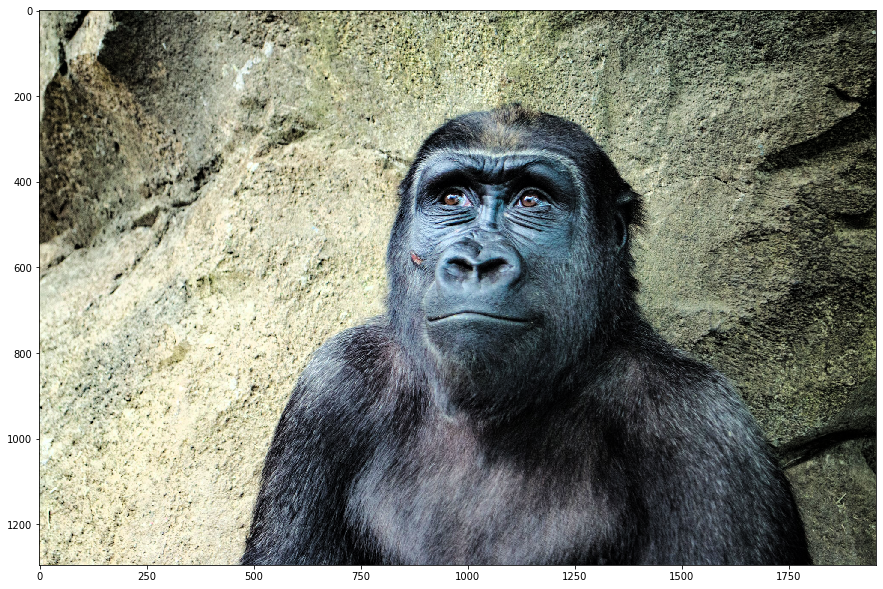

In [85]:
hsv[:,:,2] = cv.equalizeHist(hsv[:,:,2])
gorilla_eq_show = cv.cvtColor(hsv, cv.COLOR_HSV2RGB)

show_img(gorilla_eq_show)

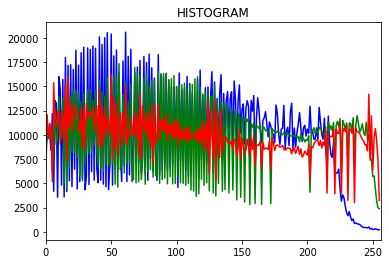

In [86]:
gorilla_eq = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
plot_histogram_all_channels(gorilla_eq)